In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from typing import Union
from einops import rearrange, repeat
from dataclasses import dataclass

import torch
import torch.nn.functional as F
from torch import nn
from torch.utils.data import DataLoader, TensorDataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [2]:
data = pd.read_csv('residuals.csv')
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

data = data[['Difficulty_residuals', 
             'Transaction Count_scaled_residuals', 
             'Active Addresses Count_residuals',
             '30 Day Active Supply_scaled_residuals',
             '1 Year Active Supply_residuals',
             'LogPriceUSD_scaled_residuals']]

In [3]:
def create_dataloader(data, historic_horizon, forecast_horizon, device, debug=False):

    X, y = [], []
    for i in range(len(data) - historic_horizon - forecast_horizon + 1):
        inputs, targets = data[:], data.iloc[:, -1]
        X.append(inputs[i:(i + historic_horizon)].values)  # All columns as input features
        y.append(targets[(i + historic_horizon):(i + historic_horizon + forecast_horizon)].values)  # Last column as target

    X, y = np.array(X), np.expand_dims(np.array(y), -1)

    X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
    y_tensor = torch.tensor(y, dtype=torch.float32).to(device)

    batch_size = 32
    dataset = TensorDataset(X_tensor, y_tensor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    
    print(f"Inputs shape: {X.shape}")
    print(f"Targets shape: {y.shape}")
    
    if debug: return (X, y)
    else: return dataloader

In [4]:
def complex_log(input, eps=1e-12):
    eps = input.new_tensor(eps)
    real = input.abs().maximum(eps).log()
    imag = (input < 0).to(input.dtype) * torch.pi
    return torch.complex(real, imag)

def selective_scan(u, dt, A, B, C, D, mode='logcumsumexp'):
    dA = torch.einsum('bld,dn->bldn', dt, A)
    dB_u = torch.einsum('bld,bld,bln->bldn', dt, u, B)
    dA = dA.clamp(min=-20)
    
    padding =  (0, 0, 0, 0, 1, 0)
    
    match mode:
        case 'cumsum':            
            dA_cumsum = F.pad(dA[:, 1:], padding).cumsum(1).exp()
            x = dB_u / (dA_cumsum + 1e-12)
            x = x.cumsum(1) * dA_cumsum
            y = torch.einsum('bldn,bln->bld', x, C)
        
        case 'logcumsumexp':  # more numerically stable (Heisen sequence)
            dB_u_log = complex_log(dB_u)
            dA_star = F.pad(dA[:, 1:].cumsum(1), padding)
            x_log = torch.logcumsumexp(dB_u_log - dA_star, 1) + dA_star
            y = torch.einsum('bldn,bln->bld', x_log.real.exp() * torch.cos(x_log.imag), C)
            
    return y + u * D

In [5]:
@dataclass
class ModelArgs:
    d_model: int
    n_layer: int
    d_state: int = 16
    expand: int = 2
    dt_rank: Union[int, str] = 'auto'
    d_conv: int = 4
    pad_vocab_size_multiple: int = 8
    conv_bias: bool = True
    bias: bool = False
    scan_mode: str = 'cumsum'
    
    def __post_init__(self):
        self.d_inner = int(self.expand * self.d_model)
        
        if self.dt_rank == 'auto':
            self.dt_rank = math.ceil(self.d_model / 16)

In [6]:
class MambaSSM(nn.Module):
    
    def __init__(self, args: ModelArgs, input_dimension: int, output_length: int):
        
        """MAMBA SSM model for time series forecasting."""
        super().__init__()
        self.args = args
        self.output_length = output_length

        # Input layer: Expecting input shape (batch_size, historic_horizon, 7)
        self.input_layer = nn.Linear(input_dimension, args.d_model)
        
        # Mamba layers
        self.layers = nn.ModuleList([ResidualBlock(args) for _ in range(args.n_layer)])
        self.norm_f = RMSNorm(args.d_model)

        # Output layer: Predicting 1 feature for each of the forecast_horizon time steps
        self.output_layer = nn.Linear(args.d_model, 1)

    def forward(self, x):
        """
        Args:
            x: A tensor of shape (batch_size, historic_horizon, 7)
        Returns:
            forecast: A tensor of shape (batch_size, forecast_horizon, 1)
        """
        # Step 1: Transform input to the appropriate shape
        x = self.input_layer(x)  # shape: (batch_size, historic_horizon, d_model)
        
        # Step 2: Process the sequence through the MAMBA blocks
        for layer in self.layers:
            x = layer(x)

        # Step 3: Normalize the output
        x = self.norm_f(x)

        # Step 4: Output the forecast (forecast_horizon x 1 feature)
        forecast = self.output_layer(x[:, -self.output_length:, :])  # Use only the forecast horizon
        
        return forecast


class ResidualBlock(nn.Module):
    
    def __init__(self, args: ModelArgs):
        
        """A residual block with MambaBlock and RMSNorm."""
        super().__init__()
        self.mixer = MambaBlock(args)
        self.norm = RMSNorm(args.d_model)
        
    def forward(self, x):
        return self.mixer(self.norm(x)) + x
            

class MambaBlock(nn.Module):
    
    def __init__(self, args: ModelArgs):
        
        """A single Mamba Block with convolutions and state-space processing."""
        super().__init__()
        self.args = args

        self.in_proj = nn.Linear(args.d_model, args.d_inner * 2, bias=args.bias)

        self.conv1d = nn.Conv1d(
            in_channels=args.d_inner,
            out_channels=args.d_inner,
            bias=args.conv_bias,
            kernel_size=args.d_conv,
            groups=args.d_inner,
            padding=args.d_conv - 1,
        )

        self.x_proj = nn.Linear(args.d_inner, args.dt_rank + args.d_state * 2, bias=False)
        self.dt_proj = nn.Linear(args.dt_rank, args.d_inner, bias=True)

        A = repeat(torch.arange(1, args.d_state + 1), 'n -> d n', d=args.d_inner)
        self.A_log = nn.Parameter(torch.log(A))
        self.D = nn.Parameter(torch.ones(args.d_inner))
        self.out_proj = nn.Linear(args.d_inner, args.d_model, bias=args.bias)
        
    def forward(self, x):
        
        """Forward pass for the Mamba block."""
        (b, l, d) = x.shape
        x_and_res = self.in_proj(x)
        (x, res) = x_and_res.split(split_size=[self.args.d_inner, self.args.d_inner], dim=-1)

        x = rearrange(x, 'b l d_in -> b d_in l')
        x = self.conv1d(x)[:, :, :l]
        x = rearrange(x, 'b d_in l -> b l d_in')
        
        x = F.silu(x)
        y = self.ssm(x)
        
        y = y * F.silu(res)
        
        return self.out_proj(y)

    def ssm(self, x):
        
        """Selective State-Space Model (SSM) forward pass."""
        (d_in, n) = self.A_log.shape
        A = -torch.exp(self.A_log.float())  # shape (d_in, n)
        D = self.D.float()

        x_dbl = self.x_proj(x)
        (delta, B, C) = x_dbl.split(split_size=[self.args.dt_rank, n, n], dim=-1)
        delta = F.softplus(self.dt_proj(delta))
        
        return selective_scan(x, delta, A, B, C, D, mode=self.args.scan_mode)


class RMSNorm(nn.Module):
    
    def __init__(self, d_model: int, eps: float = 1e-5):
        super().__init__()
        self.eps = eps
        self.weight = nn.Parameter(torch.ones(d_model))

    def forward(self, x):
        return x * torch.rsqrt(x.pow(2).mean(-1, keepdim=True) + self.eps) * self.weight

def create_model(data, forecast_horizon, device):
    
    input_dimension = len(data.columns)
    output_length = forecast_horizon
    
    arguments  = ModelArgs(d_model = 32, n_layer = 8)
    
    model = MambaSSM(arguments, input_dimension, output_length).to(device)
    print("Mamba SSM model successfully initialized.")
    return model

In [7]:
historic_horizon = 6 * 365  # Use the last 8 years to predict
forecast_horizon = 365  # Predict the next year

dataloader = create_dataloader(data, historic_horizon, forecast_horizon, device, debug=False)

model = create_model(data, forecast_horizon, device)
model_name = model.__class__.__name__
force_teaching = "Transformer" in model_name
model = nn.DataParallel(model, device_ids=list(range(1))) # In case of multiple GPUs

Inputs shape: (2565, 2190, 6)
Targets shape: (2565, 365, 1)
Mamba SSM model successfully initialized.


In [10]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)

model.train()
epochs = 1000
for epoch in range(epochs):
    for inputs, targets in dataloader:        
        optimizer.zero_grad()
        
        if force_teaching: outputs = model(inputs, torch.zeros_like(inputs))
        else: outputs = model(inputs)
            
        outputs = outputs.squeeze(-1)        
        targets = targets.squeeze(-1)
        
        loss = criterion(outputs, targets)
        loss.backward()

        # Gradient clipping (optional, for LSTMs)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        
    scheduler.step(loss)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {loss.item():.4f}, LR: {optimizer.param_groups[0]['lr']:.8f}")

KeyboardInterrupt: 

In [12]:
torch.save(model.state_dict(), f'{model_name}-loss-{loss.item():.4f}.pt')
print(f'{model_name}-loss-{loss.item():.4f}.pt Saved.')

NameError: name 'loss' is not defined

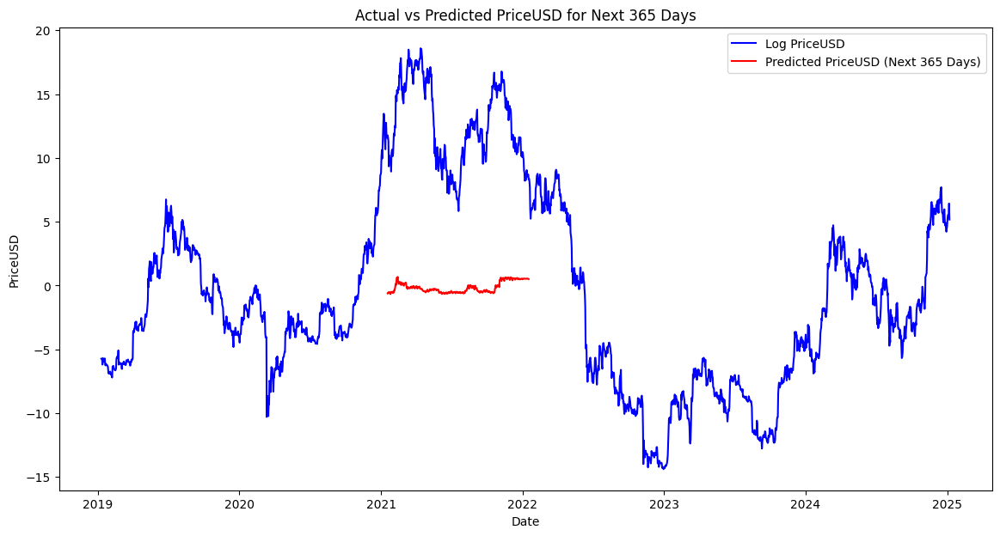

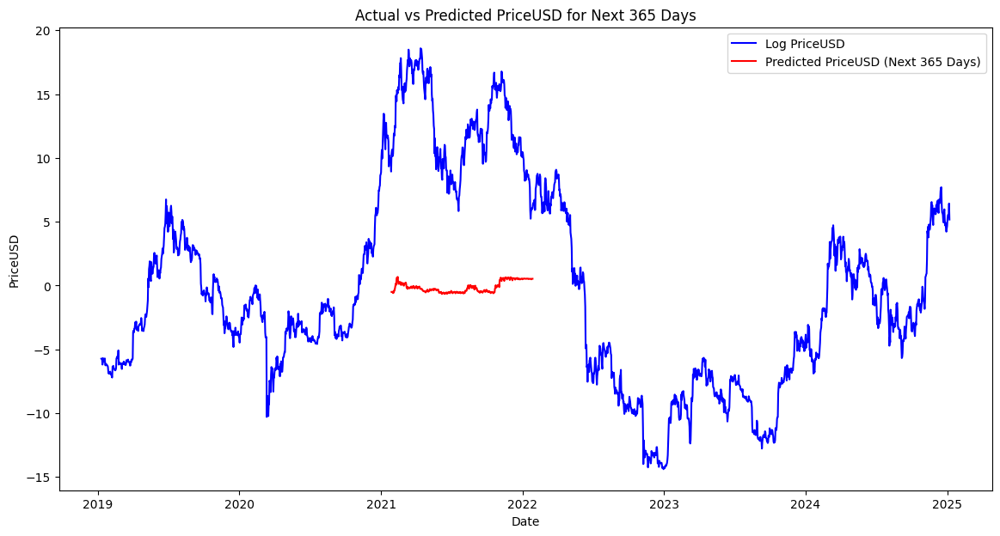

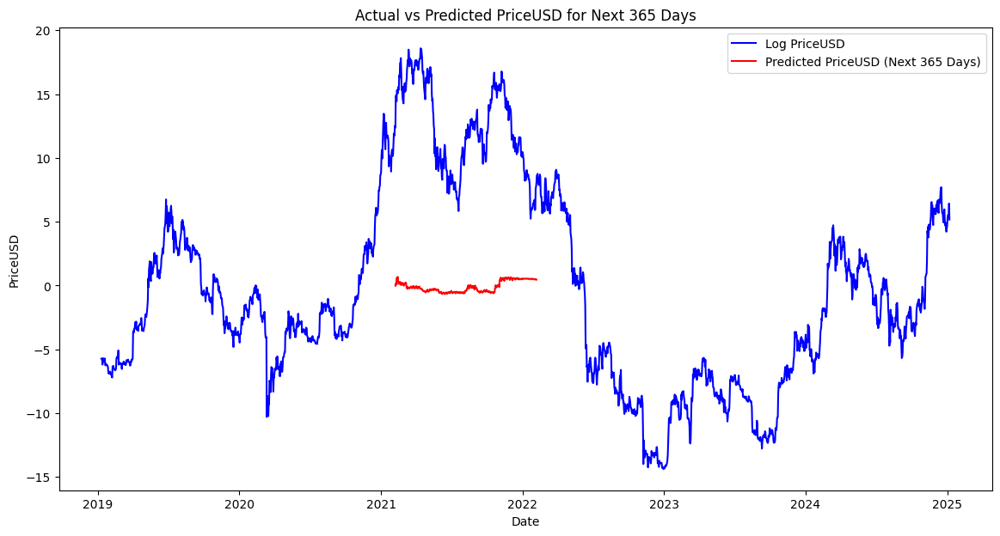

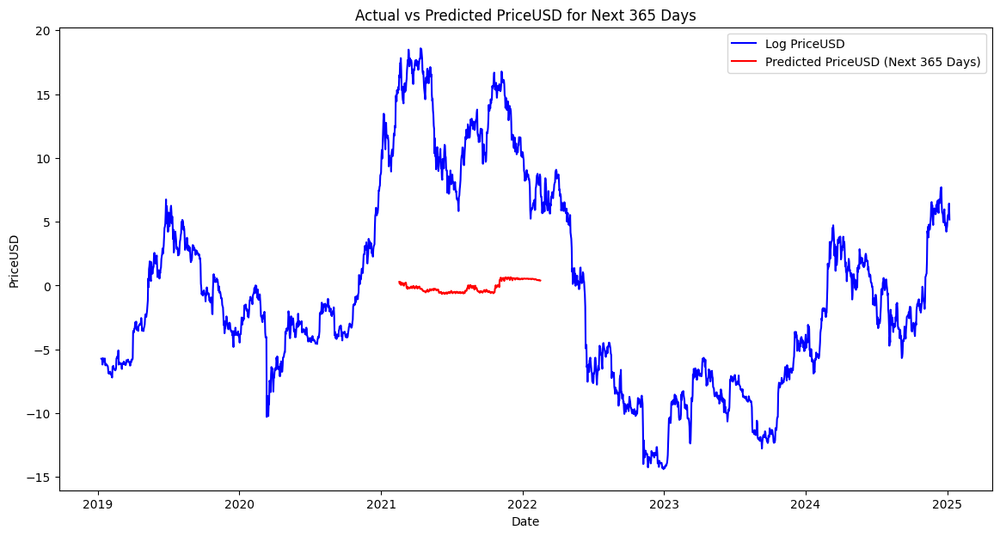

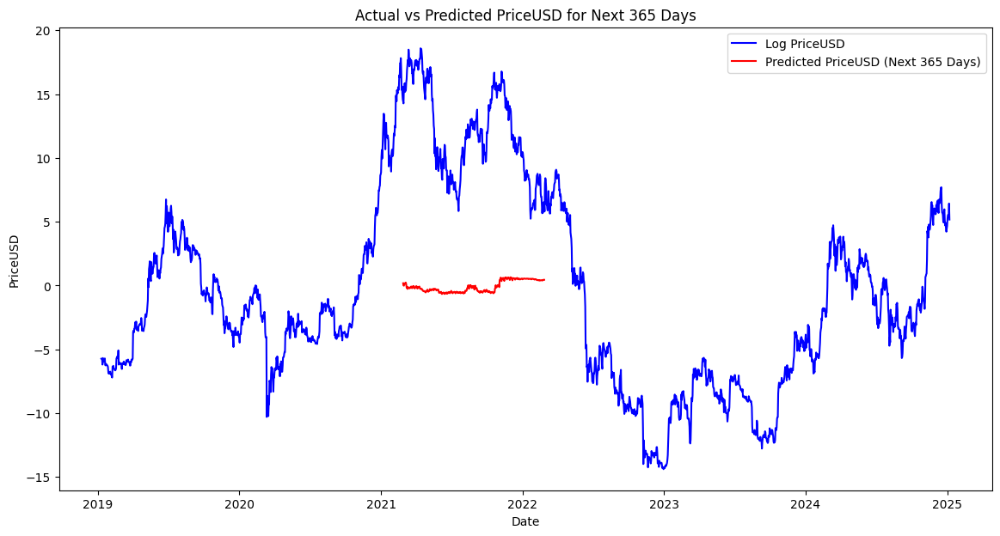

...

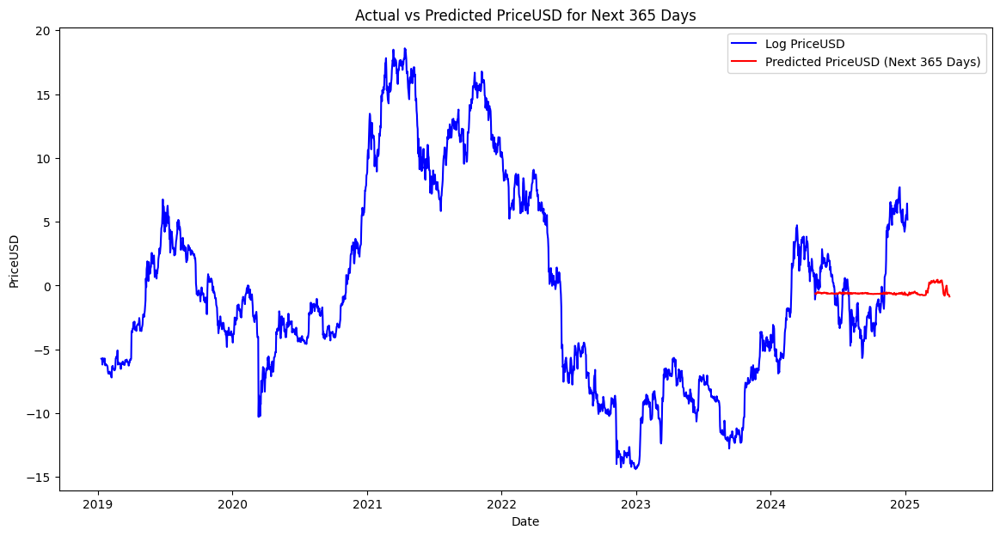

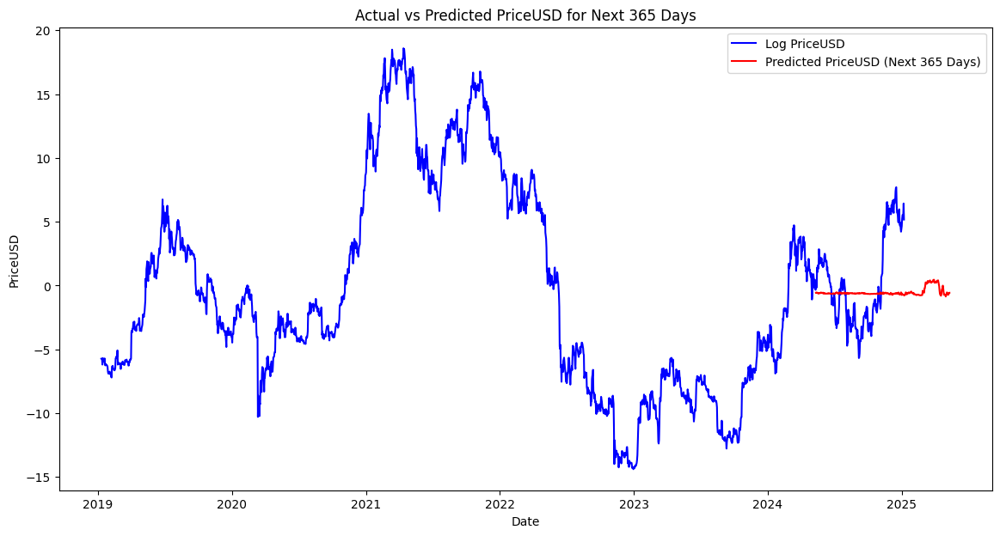

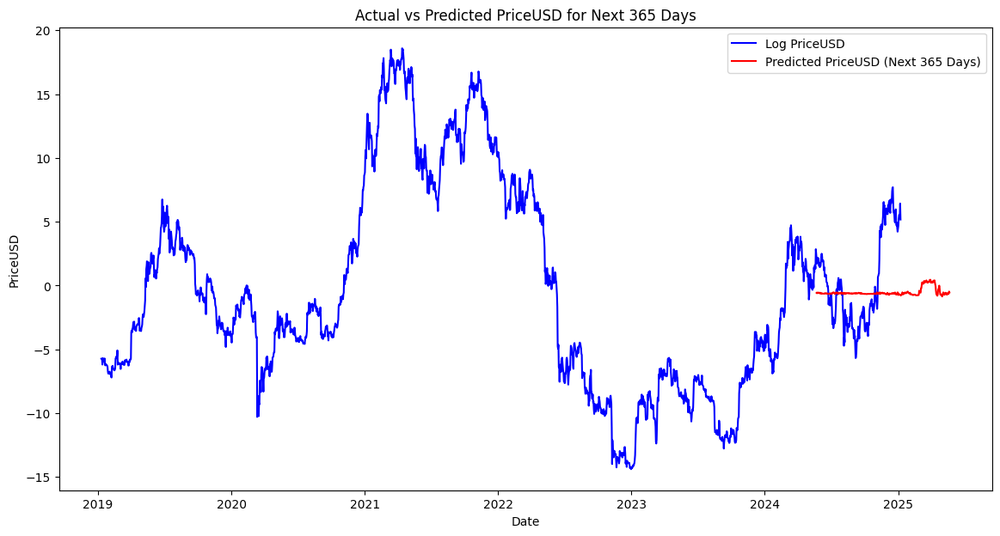

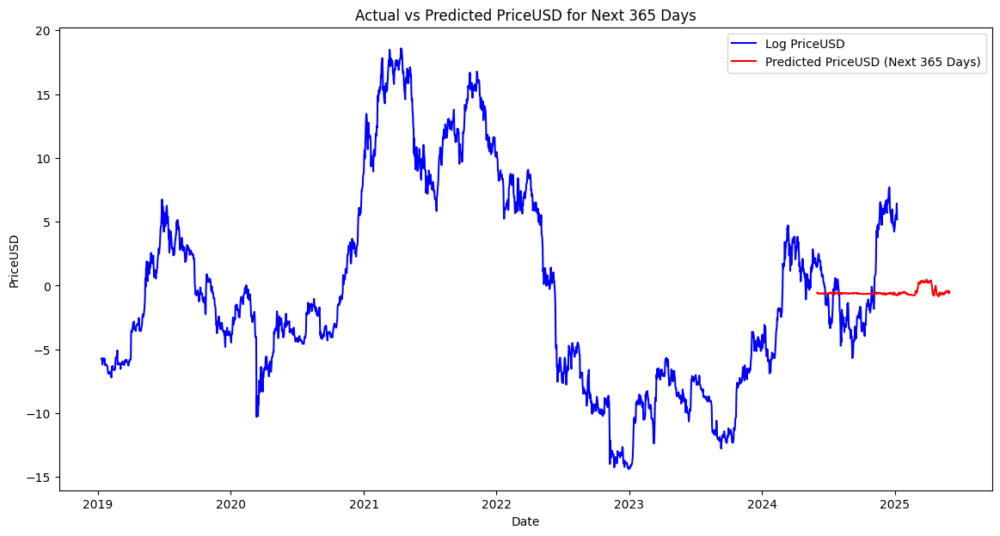

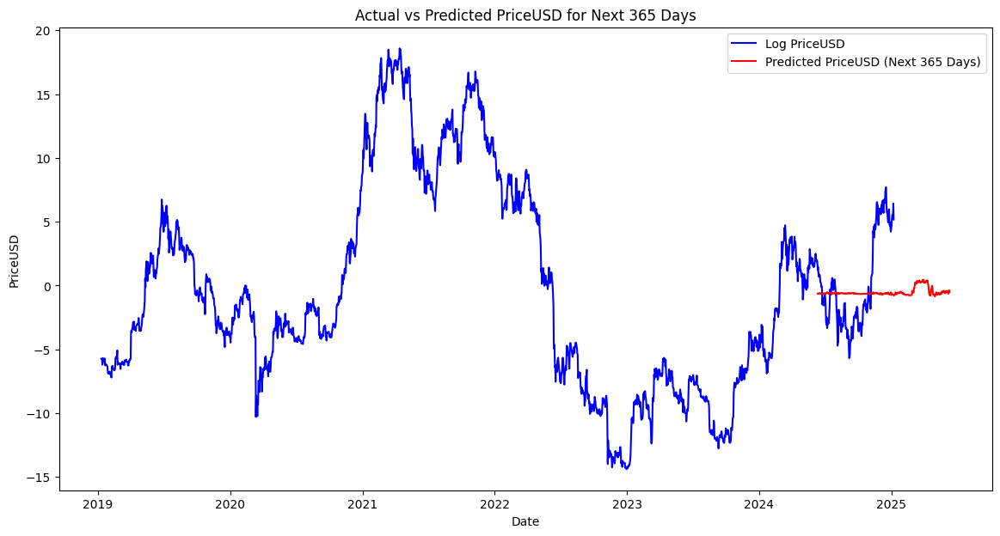

In [ ]:
model.eval()

timerange = list(range(1, 4*365, 10))
timerange.reverse()

for timeback in timerange:
    with torch.no_grad():
        predictions = []
        past = torch.tensor(data.iloc[-historic_horizon-timeback:-timeback, :].values, dtype=torch.float32).unsqueeze(0).to(device)
        
        if force_teaching: pred = model(past, torch.zeros_like(past))
        else: pred = model(past)
            
        predictions.append(pred.cpu().numpy().flatten())  # Flatten the prediction and move to CPU for further processing
        predictions = np.array(predictions).flatten()

    # Create DataFrame for predictions
    predicted_dates = pd.date_range(start=data.index[-1-timeback] + pd.Timedelta(days=1), periods=len(predictions))
    predicted_price = pd.DataFrame(predictions, index=predicted_dates, columns=['Predicted PriceUSD'])

    # Plot results
    plt.figure(figsize=(14, 7))
    plt.plot(data.index[-historic_horizon:], data['LogPriceUSD_scaled_residuals'][-historic_horizon:], label='Log PriceUSD', color='blue')
    plt.plot(predicted_price.index, predicted_price['Predicted PriceUSD'], label='Predicted PriceUSD (Next 365 Days)', color='red')
    plt.title('Actual vs Predicted PriceUSD for Next 365 Days')
    plt.xlabel('Date')
    plt.ylabel('PriceUSD')
    plt.legend()
    plt.show()

